# first step - install the libraries

In [1]:
# %pip install wikipedia
%pip install wikipedia-api
%pip install networkx
%pip install matplotlib
# %pip install wikipediaapi


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


This cell will down load the data from wikipedia and create the graph.

max_depth - the depth we want to get inside the links.

start_page_name - the title of the first article we start from.

Output - directed graph

In [4]:
import wikipediaapi
import networkx as nx
import concurrent.futures
import time
import json

def fetch_page_data(page_name):
    # Fetch data for a single page
    try:
        # Simulate delay to avoid rate limits
        time.sleep(0.005)
        page = wiki_wiki.page(page_name)
        return page.text[:100]  # Just an example, fetch whatever data you need
    except Exception as e:
        print(f"Error fetching page '{page_name}': {e}")
        return None

def create_directed_graph_parallel(wiki_wiki, start_page, max_depth=3, max_workers=10):
    """
    Creates a directed graph of Wikipedia articles with depth exploration (continues exploring even at dead ends).

    Args:
        wiki_wiki (wikipediaapi.Wikipedia): Wikipedia API object.
        start_page (wikipediaapi.Page): The starting Wikipedia page.
        max_depth (int, optional): Maximum depth of exploration from the seed node. Defaults to 3.
        max_workers (int, optional): Maximum number of worker threads for parallel processing. Defaults to 10.

    Returns:
        networkx.DiGraph: The created directed graph, or None if an error occurs.
    """
    try:
        graph = nx.DiGraph()  # Create a new DiGraph for each exploration
        graph.add_node(start_page.title)  # Add starting node

        queue = [(start_page, 1)]  # Queue for BFS exploration, storing (page, depth) tuples

        with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
            while queue:
                page, depth = queue.pop(0)  # Get page and depth from the front of the queue
                print(f"Exploring page: {page.title}, Depth: {depth}")

                if depth > max_depth:
                    continue  # Skip exploration if depth exceeds maximum

                # Fetch page data in parallel
                future_to_page_name = {executor.submit(fetch_page_data, link.title): link.title for link in page.links.values()}
                for future in concurrent.futures.as_completed(future_to_page_name):
                    linked_page_name = future_to_page_name[future]
                    try:
                        linked_page_data = future.result()
                        if linked_page_data is not None:
                            # Add linked page node and edge to graph
                            graph.add_node(linked_page_name)
                            graph.add_edge(page.title, linked_page_name)
                            queue.append((wiki_wiki.page(linked_page_name), depth + 1))
                    except Exception as e:
                        print(f"Error processing linked page '{linked_page_name}': {e}")

        return graph

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Set up Wikipedia API (replace with your email and password)
wiki_wiki = wikipediaapi.Wikipedia('moyal.shoham@gmail.com', 'en')

# Starting search term (use a page with many links)
start_page_name = "Re'im music festival massacre"  # Adjust as needed
start_page = wiki_wiki.page(start_page_name)

# Adjust max_depth as needed (higher depth explores more links)
max_depth = 2

# Adjust max_workers based on your system resources
max_workers = 10  # Adjust as needed

# Create the directed graph (handle potential error)
graph = create_directed_graph_parallel(wiki_wiki, start_page, max_depth, max_workers)

if graph is None:
    print("Error creating graph. See error messages for details.")
else:
    # Print some graph statistics
    print(f"Number of nodes: {graph.number_of_nodes()}")
    print(f"Number of edges: {graph.number_of_edges()}")

    # You can now analyze or visualize the graph using NetworkX functions








Exploring page: Re'im music festival massacre, Depth: 1
Exploring page: 2006 shelling of Beit Hanoun, Depth: 2
Exploring page: 2018–2019 Gaza border protests, Depth: 2
Exploring page: 2021 Israel–Palestine crisis, Depth: 2
Exploring page: 2022 Gaza–Israel clashes, Depth: 2
Exploring page: 2023 Arab–Islamic extraordinary summit, Depth: 2
Exploring page: 2006 Gaza cross-border raid, Depth: 2
Exploring page: 2010 Palestinian militancy campaign, Depth: 2
Exploring page: 2006 Israeli operation in Beit Hanoun, Depth: 2
Exploring page: 2008 breach of the Egypt–Gaza border, Depth: 2
Exploring page: 2014 Gaza war beach bombing incidents, Depth: 2
Exploring page: 2006 Gaza–Israel conflict, Depth: 2
Exploring page: 2011 southern Israel cross-border attacks, Depth: 2
Exploring page: 2023 Bitung clashes, Depth: 2
Exploring page: 2023 Democratic National Committee protests, Depth: 2
Exploring page: 2012 Israeli operation in the Gaza Strip, Depth: 2
Exploring page: 2023 Givat Shaul shooting, Depth: 2

This cell save the data of graph into json file


In [5]:
## Save the graph to a JSON file - WORKING

# Convert the graph to JSON-serializable format
graph_data = nx.node_link_data(graph)

# Save the graph data as a JSON file
with open('graph_data.json', 'w') as file:
    json.dump(graph_data, file)

This cell create a new graph according to json file

In [6]:
## Read the data from the JSON file and create a new graph - WORKING

# Load the graph data from the JSON file
with open('graph_data.json', 'r') as file:
    loaded_graph_data = json.load(file)



# Create a new directed graph from the loaded data
loaded_graph = nx.node_link_graph(loaded_graph_data)


This cell is used to plot the graph

In [ ]:
#plot the graph - WORKINGS
# Visualize the graph using Matplotlib
import matplotlib.pyplot as plt

# Draw the graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(loaded_graph)  # Set layout
nx.draw(loaded_graph, pos, with_labels=False, node_size=50, node_color="skyblue", font_size=10, font_color="black", edge_color="gray", linewidths=0.001, arrowsize=1)
plt.title("Wikipedia Article Graph")
plt.show()




calculating of 
- density
- average clustering
- number of connected components
- largest component size
- diameter of the graph


In [7]:
import networkx as nx

# Check if the graph is strongly connected
if nx.is_strongly_connected(loaded_graph):
    diameter = nx.diameter(loaded_graph)
else:
    diameter = "Graph is not strongly connected, so diameter is undefined"

# Calculate other statistics
density = nx.density(loaded_graph)
average_clustering = nx.average_clustering(loaded_graph)
num_connected_components = nx.number_weakly_connected_components(loaded_graph)
largest_component_size = len(max(nx.weakly_connected_components(loaded_graph), key=len))

# Print the graph statistics
print(f"Density: {density}")
print(f"Average Clustering: {average_clustering}")
print(f"Number of Connected Components: {num_connected_components}")
print(f"Size of Largest Connected Component: {largest_component_size}")
print(f"Diameter: {diameter}")


Density: 6.548443129667697e-05
Average Clustering: 0.19493142723158616
Number of Connected Components: 1
Size of Largest Connected Component: 51221
Diameter: Graph is not strongly connected, so diameter is undefined


calculate and printing the page rank of the top 20 nodes

In [26]:
# Calculate the PageRank of each node
pagerank = nx.pagerank(loaded_graph)

# Sort the nodes by PageRank value
sorted_pagerank = {k: v for k, v in sorted(pagerank.items(), key=lambda item: item[1], reverse=True)}

# Print the top 20 nodes by PageRank
print("Top 20 nodes by PageRank:")
for i, (node, rank) in enumerate(sorted_pagerank.items()):
    print(f"{i + 1}. {node}: {rank}")
    if i == 19:
        break



Top 20 nodes by PageRank:
1. Wikipedia:Protection policy: 3.942727729619766e-05
2. Israel–Hamas war: 3.815296365369648e-05
3. Israel: 3.628330638492761e-05
4. 2023 Hamas-led attack on Israel: 3.3950695439078576e-05
5. Re'im music festival massacre: 3.363250107483733e-05
6. Blockade of the Gaza Strip: 3.3264722094129444e-05
7. Gaza–Israel conflict: 3.3239391711507155e-05
8. Israeli invasion of the Gaza Strip (2023–present): 3.311618059754425e-05
9. Hamas: 3.304638805780259e-05
10. 2023 Israeli blockade of the Gaza Strip: 3.3044104757325594e-05
11. Gaza Strip famine: 3.2743208110607375e-05
12. Israeli settlement: 3.2227766763447706e-05
13. Iran–Israel proxy conflict: 3.221433758724657e-05
14. Israeli disengagement from Gaza: 3.216293914250628e-05
15. List of Palestinian rocket attacks on Israel in 2023: 3.204443861275925e-05
16. ISSN (identifier): 3.181284395358999e-05
17. Be'eri massacre: 3.172692621886702e-05
18. South Africa v. Israel (Genocide Convention): 3.172434783236559e-05
19. P

calculate and draw the degree distribution of the graph

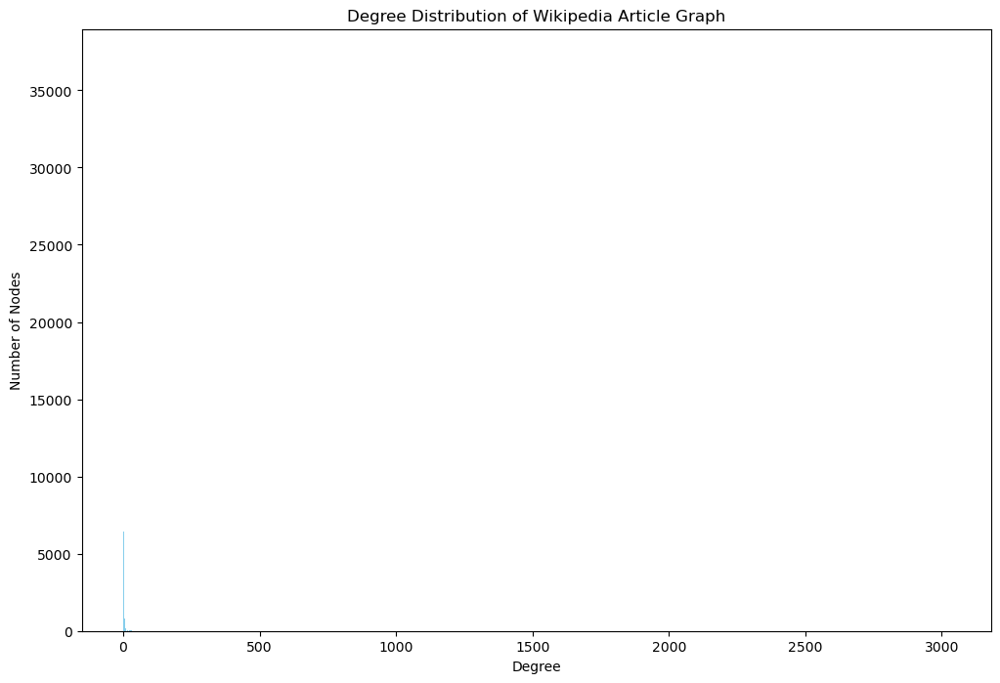

In [27]:
# calculate and draw on a graph the degrees distribution

# Calculate the degree distribution of the graph
degree_distribution = nx.degree_histogram(loaded_graph)

# Plot the degree distribution
plt.figure(figsize=(12, 8))
plt.bar(range(len(degree_distribution)), degree_distribution, color="skyblue")
plt.title("Degree Distribution of Wikipedia Article Graph")
plt.xlabel("Degree")
plt.ylabel("Number of Nodes")
plt.show()


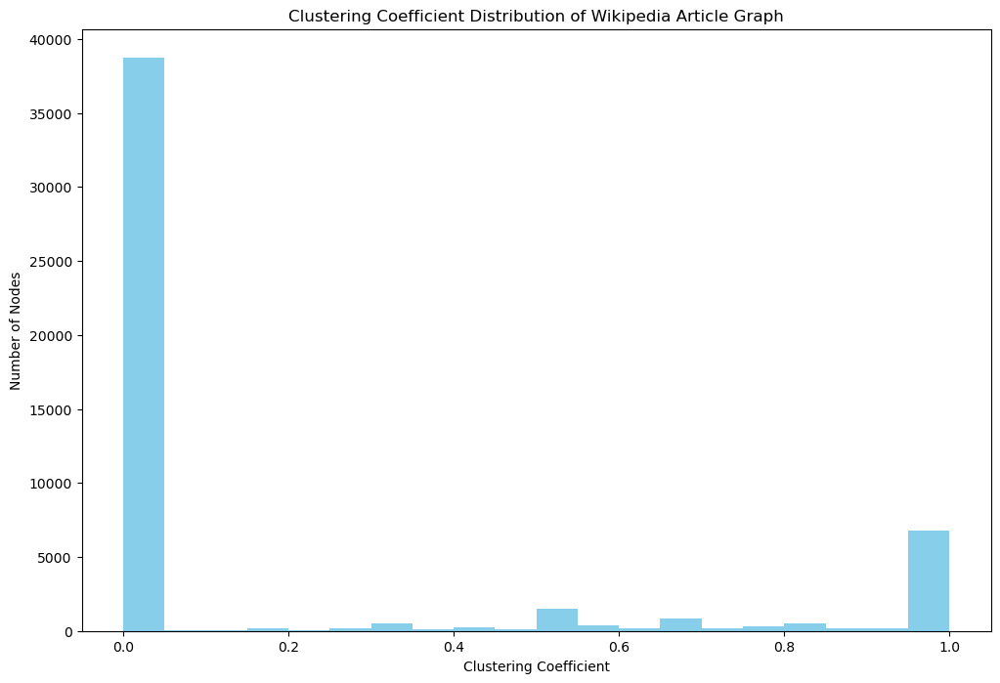

In [28]:
# calculate and draw on a graph the clustering coefficient distribution

# Calculate the clustering coefficient of each node
clustering_coefficients = nx.clustering(loaded_graph)

# Plot the clustering coefficient distribution
plt.figure(figsize=(12, 8))
plt.hist(list(clustering_coefficients.values()), bins=20, color="skyblue")
plt.title("Clustering Coefficient Distribution of Wikipedia Article Graph")
plt.xlabel("Clustering Coefficient")
plt.ylabel("Number of Nodes")
plt.show()


### 
need to check this cell !
###

In [29]:
grouped_data = {}

for node in graph.nodes(): 
    tmp = wiki.page(node)
    delay = 0.05
    time.sleep(delay)
    try:
        categories = tmp.categories.keys()
        for category in categories:
            if category not in grouped_data:
                grouped_data[category] = []
            grouped_data[category].append(tmp)
    except:
        print(f"No categories found for node: {node}")

# Print the grouped data
for category, pages in grouped_data.items():
    print(f"Category: {category}")
    for page in pages:
        print(f"Page: {page.title}")


NameError: name 'wiki' is not defined